# DRIVE: image segmentation for retinal vessel extraction using U-Net

This notebook was originally run in Colab

In [9]:
import tensorflow as tf
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
#from keras_cv.layers import DropBlock2D

from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.optimizers import Adam
from keras.callbacks import TensorBoard
from keras import mixed_precision
from keras.callbacks import ModelCheckpoint, EarlyStopping, Callback
from keras.optimizers.schedules import ExponentialDecay

import datetime

from src.DataLoader import DataLoader
from src.UNet_builder import build_unet, build_unet_bn, UNet_light
from src.CMP_UNet_builder import build_CMP_UNet, build_CMP_UNet_CBAM
from src.dl_utils import plot_history
from src.SegmentationPlotter import plot_images_with_masks, PredictionPlotter
from src.SA_UNet import SA_UNet, spatial_attention, SA_UNet_CFFA_CBAM, SA_UNet_CFFA_CBAM_deep
from src.segmentation_losses import *

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Data loading and split

In [2]:
X_dir = './data/training/images'
y_dir = './data/training/1st_manual'
mask_dir = './data/training/mask'
test_dir = './data/test/images'

In [ ]:
X = DataLoader.load_images_from_dir(X_dir)
y = DataLoader.load_images_from_dir(y_dir)
masks = DataLoader.load_images_from_dir(mask_dir)
masks = np.expand_dims(masks, axis=-1)
X_test = DataLoader.load_images_from_dir(test_dir)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state = 42)

In [ ]:
X_train.shape

(16, 544, 544, 3)

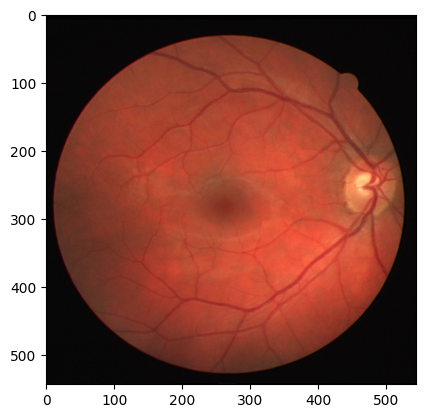

In [ ]:
plt.imshow(X_train[0])

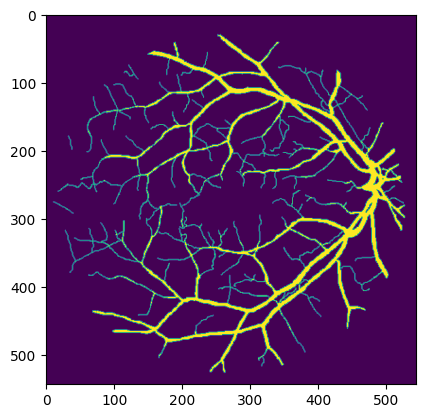

In [ ]:
plt.imshow(y_train[0])

## Modelling

The height and width of the images should be divisible by 32 to accomodate the U-Net architecture.

In [3]:
IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]

NameError: name 'X_train' is not defined

### Binary crossentropy loss

In [ ]:
earlystopper = EarlyStopping(
            patience=10,
            verbose=1
)
model_checkpoint = ModelCheckpoint(
            filepath = 'UNET_CE',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)

In [ ]:
model = build_unet(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model.compile(optimizer = Adam(learning_rate=1e-4), loss = 'binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 544, 544, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 544, 544, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 activation (Activation)     (None, 544, 544, 64)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 544, 544, 64)         36928     ['activation[0][0]']          
                                                                                              

In [ ]:
#train unet
history = model.fit(X_train, y_train, batch_size=4, epochs = 100, callbacks = [earlystopper, model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/100
4/4 [==============================] - ETA: 0s - loss: 0.6782 - accuracy: 0.8694
Epoch 1: val_loss improved from inf to 0.66201, saving model to UNET_CE
4/4 [==============================] - 42s 2s/step - loss: 0.6782 - accuracy: 0.8694 - val_loss: 0.6620 - val_accuracy: 0.8726
Epoch 2/100
4/4 [==============================] - ETA: 0s - loss: 0.6540 - accuracy: 0.8788
Epoch 2: val_loss improved from 0.66201 to 0.63572, saving model to UNET_CE
4/4 [==============================] - 6s 2s/step - loss: 0.6540 - accuracy: 0.8788 - val_loss: 0.6357 - val_accuracy: 0.8726
Epoch 3/100
4/4 [==============================] - ETA: 0s - loss: 0.6240 - accuracy: 0.8788
Epoch 3: val_loss improved from 0.63572 to 0.58850, saving model to UNET_CE
4/4 [==============================] - 7s 2s/step - loss: 0.6240 - accuracy: 0.8788 - val_loss: 0.5885 - val_accuracy: 0.8726
Epoch 4/100
4/4 [==============================] - ETA: 0s - loss: 0.5522 - accuracy: 0.8788
Epoch 4: val_loss improve

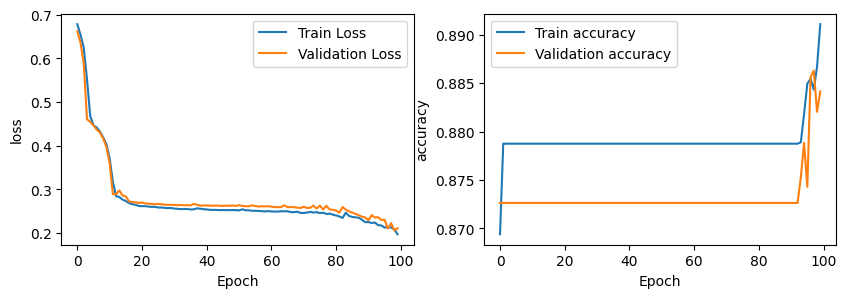

In [ ]:
plot_history(history)

In [ ]:
model.load_weights('UNET_CE')

predictions = model.predict(X_val)

1/1 [==============================] - 0s 300ms/step


In [ ]:
def plot_images_with_masks(original, segmentation_mask, predicted_mask):
    """
    Plots the original image, segmentation mask, and predicted mask with a colorbar for the predicted mask.

    Parameters:
        original (ndarray): The original image.
        segmentation_mask (ndarray): The segmentation mask.
        predicted_mask (ndarray): The predicted mask.
    """

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # Adjust size as needed

    # Show original image
    ax = axes[0]
    ax.imshow(original, cmap='gray')
    ax.set_title('Original Image')
    ax.axis('off')  # Hide axes ticks

    # Show segmentation mask
    ax = axes[1]
    im_seg = ax.imshow(segmentation_mask, cmap='plasma')
    ax.set_title('Manual Segmentation')
    ax.axis('off')

    # Show predicted mask
    ax = axes[2]
    im_pred = ax.imshow(predicted_mask, cmap='plasma')
    ax.set_title('Predicted Segmentation')
    ax.axis('off')

    # Colorbar for the predicted mask
    fig.colorbar(im_pred, ax=axes[2], fraction=0.046, pad=0.04)  # adjust fraction and pad to fit layout

    plt.tight_layout()
    plt.show()


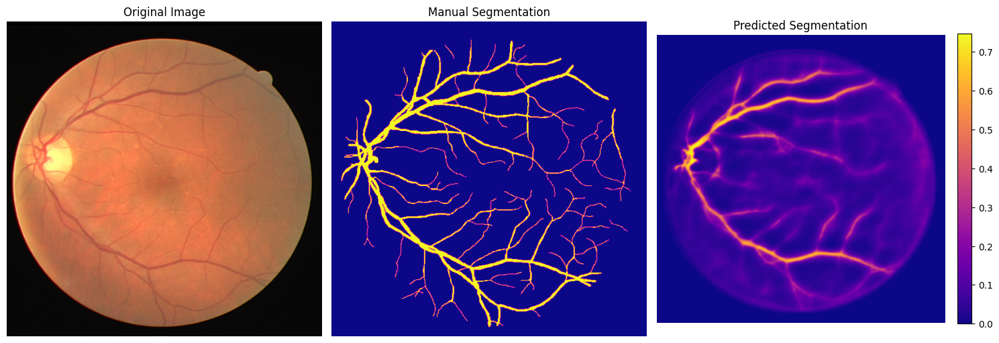

In [ ]:
plot_images_with_masks(X_val[0], y_val[0], predictions[0])

Predictions aren't very good yet, but we can already clearly see some veins being extracted. Only a small part of the pixels contain vessels, so to accomodate these imbalances we experiment with different loss functions before further model tuning.

## Experimentation with IOU and DICE loss

### IOU loss

In [ ]:
# seems to work best with high number of epochs and bn
model_IOU = build_unet(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model_IOU.compile(optimizer = Adam(learning_rate=1e-4), loss = iou_loss, metrics=['accuracy'])
model_IOU.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 544, 544, 3)]        0         []                            
                                                                                                  
 conv2d_19 (Conv2D)          (None, 544, 544, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 activation_18 (Activation)  (None, 544, 544, 64)         0         ['conv2d_19[0][0]']           
                                                                                                  
 conv2d_20 (Conv2D)          (None, 544, 544, 64)         36928     ['activation_18[0][0]']       
                                                                                              

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = 'UNET_IOU',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)
history = model_IOU.fit(X_train, y_train, batch_size=4, epochs = 100, callbacks = [earlystopper, model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/100
4/4 [==============================] - ETA: 0s - loss: 0.9212 - accuracy: 0.2878
Epoch 1: val_loss improved from inf to 0.91642, saving model to UNET_IOU
4/4 [==============================] - 13s 2s/step - loss: 0.9212 - accuracy: 0.2878 - val_loss: 0.9164 - val_accuracy: 0.0553
Epoch 2/100
4/4 [==============================] - ETA: 0s - loss: 0.9201 - accuracy: 0.0490
Epoch 2: val_loss improved from 0.91642 to 0.91538, saving model to UNET_IOU
4/4 [==============================] - 6s 2s/step - loss: 0.9201 - accuracy: 0.0490 - val_loss: 0.9154 - val_accuracy: 0.0472
Epoch 3/100
4/4 [==============================] - ETA: 0s - loss: 0.9190 - accuracy: 0.0453
Epoch 3: val_loss improved from 0.91538 to 0.91422, saving model to UNET_IOU
4/4 [==============================] - 7s 2s/step - loss: 0.9190 - accuracy: 0.0453 - val_loss: 0.9142 - val_accuracy: 0.0469
Epoch 4/100
4/4 [==============================] - ETA: 0s - loss: 0.9178 - accuracy: 0.0462
Epoch 4: val_loss impr

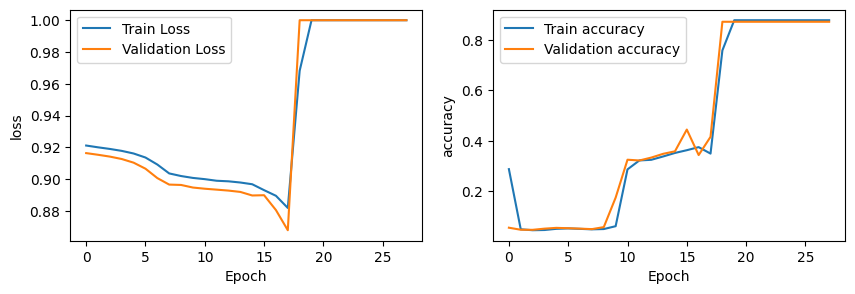

In [ ]:
plot_history(history)

A problem with IOU is that the gradient can become 0 when the loss is 1. To help prevent this we add batchnorm to the U-Net.

In [ ]:
model_IOU = build_unet_bn(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model_IOU.compile(optimizer = Adam(learning_rate=1e-4), loss = iou_loss, metrics=['accuracy'])
model_IOU.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 544, 544, 3)]        0         []                            
                                                                                                  
 conv2d_95 (Conv2D)          (None, 544, 544, 64)         1792      ['input_6[0][0]']             
                                                                                                  
 batch_normalization_48 (Ba  (None, 544, 544, 64)         256       ['conv2d_95[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_90 (Activation)  (None, 544, 544, 64)         0         ['batch_normalization_48[0

In [ ]:
earlystopper = EarlyStopping(
            patience=20,
            verbose=1
)
model_checkpoint = ModelCheckpoint(
            filepath = 'UNET_IOU',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)
history = model_IOU.fit(X_train, y_train, batch_size=4, epochs = 100, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/100
4/4 [==============================] - ETA: 0s - loss: 0.9098 - accuracy: 0.4706
Epoch 1: val_loss improved from inf to 0.91746, saving model to UNET_IOU
4/4 [==============================] - 21s 3s/step - loss: 0.9098 - accuracy: 0.4706 - val_loss: 0.9175 - val_accuracy: 0.2938
Epoch 2/100
4/4 [==============================] - ETA: 0s - loss: 0.8791 - accuracy: 0.4492
Epoch 2: val_loss improved from 0.91746 to 0.91693, saving model to UNET_IOU
4/4 [==============================] - 10s 3s/step - loss: 0.8791 - accuracy: 0.4492 - val_loss: 0.9169 - val_accuracy: 0.0489
Epoch 3/100
4/4 [==============================] - ETA: 0s - loss: 0.8641 - accuracy: 0.4657
Epoch 3: val_loss did not improve from 0.91693
4/4 [==============================] - 2s 600ms/step - loss: 0.8641 - accuracy: 0.4657 - val_loss: 0.9169 - val_accuracy: 0.0473
Epoch 4/100
4/4 [==============================] - ETA: 0s - loss: 0.8500 - accuracy: 0.5342
Epoch 4: val_loss did not improve from 0.91693
4

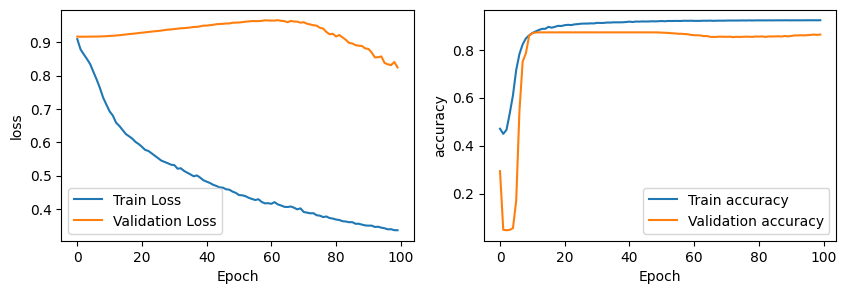

In [ ]:
plot_history(history)

In [ ]:
predictions = model_IOU.predict(X_val)

1/1 [==============================] - 0s 441ms/step


In [ ]:
predictions_train = model_IOU.predict(X_train)

1/1 [==============================] - 45s 45s/step


In [ ]:
### WRONG:

In the plots below can be seen that, on train data, the model already gives good predictions. On validation data however only the largest vessels can be detected.

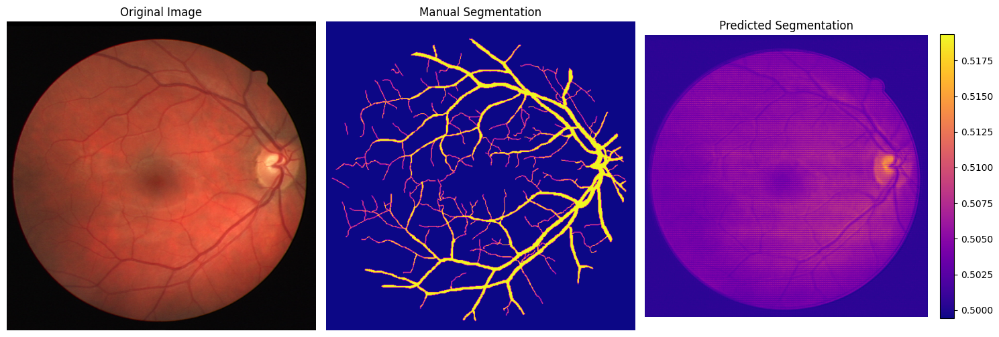

In [ ]:
plot_images_with_masks(X_train[0], y_train[0], predictions_train[0])

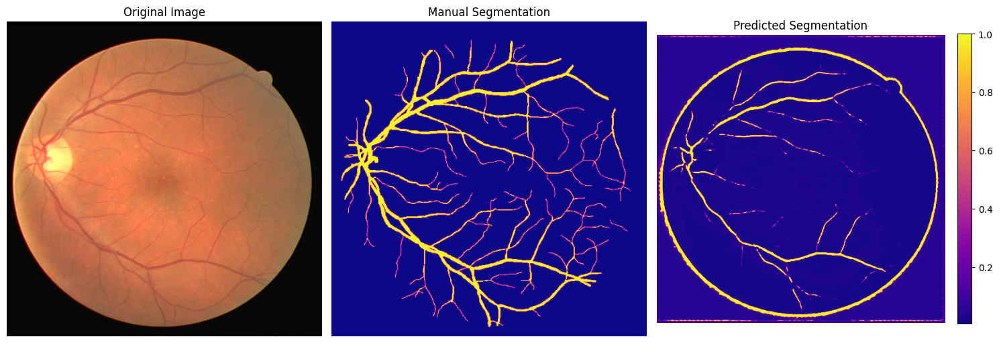

In [ ]:
plot_images_with_masks(X_val[0], y_val[0], predictions[0])

Validation loss starts to decrease around epoch 70, more epochs could benefit the predictions. Let's first look at how the dice loss performs

### DICE loss

In [ ]:
model_dice = build_unet_bn(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model_dice.compile(optimizer = Adam(learning_rate=1e-4), loss = dice_loss, metrics=['accuracy'])
model_dice.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 544, 544, 3)]        0         []                            
                                                                                                  
 conv2d_133 (Conv2D)         (None, 544, 544, 64)         1792      ['input_8[0][0]']             
                                                                                                  
 batch_normalization_80 (Ba  (None, 544, 544, 64)         256       ['conv2d_133[0][0]']          
 tchNormalization)                                                                                
                                                                                                  
 activation_126 (Activation  (None, 544, 544, 64)         0         ['batch_normalization_80[0

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = 'UNET_DICE',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)
history = model_dice.fit(X_train, y_train, batch_size=4, epochs = 100, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/100
4/4 [==============================] - ETA: 0s - loss: 0.8226 - accuracy: 0.4551
Epoch 1: val_loss improved from inf to 0.84740, saving model to UNET_IOU
4/4 [==============================] - 21s 4s/step - loss: 0.8226 - accuracy: 0.4551 - val_loss: 0.8474 - val_accuracy: 0.5088
Epoch 2/100
4/4 [==============================] - ETA: 0s - loss: 0.7764 - accuracy: 0.4606
Epoch 2: val_loss did not improve from 0.84740
4/4 [==============================] - 2s 608ms/step - loss: 0.7764 - accuracy: 0.4606 - val_loss: 0.8477 - val_accuracy: 0.7110
Epoch 3/100
4/4 [==============================] - ETA: 0s - loss: 0.7583 - accuracy: 0.4669
Epoch 3: val_loss did not improve from 0.84740
4/4 [==============================] - 2s 613ms/step - loss: 0.7583 - accuracy: 0.4669 - val_loss: 0.8484 - val_accuracy: 0.7160
Epoch 4/100
4/4 [==============================] - ETA: 0s - loss: 0.7389 - accuracy: 0.5492
Epoch 4: val_loss did not improve from 0.84740
4/4 [========================

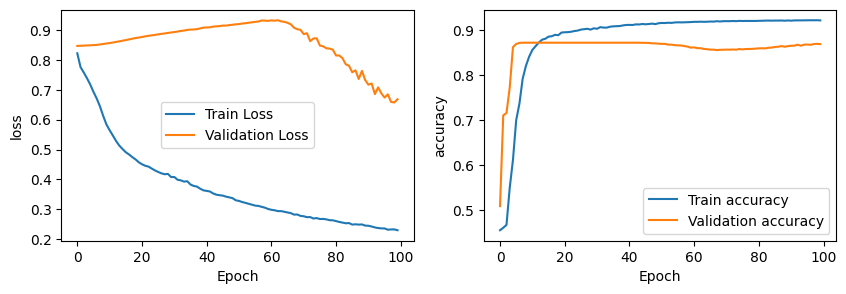

In [ ]:
plot_history(history)

In [ ]:
model_dice.load_weights('UNET_DICE')
predictions = model_dice.predict(X_val)

1/1 [==============================] - 0s 459ms/step


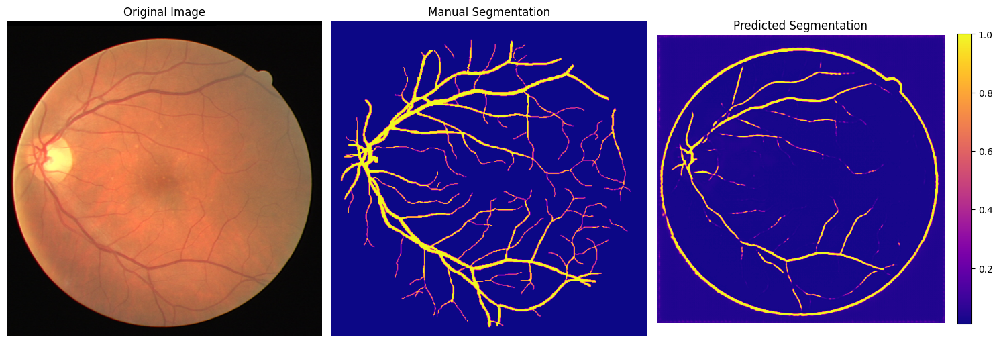

In [ ]:
plot_images_with_masks(X_val[0], y_val[0], predictions[0])

In [ ]:
#old photos:

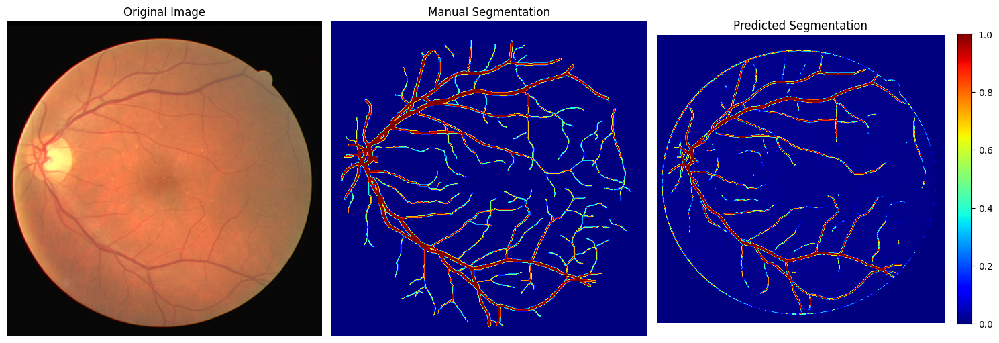

In [ ]:
plot_images_with_masks(X_train[0], y_train[0], predictions[0]*masks[0])

Already way better results. Convergence is slow so try experimenting with higher learning rate.

#### Lightweight version to benchmark against CBAM-UNet and CMP-UNet

In [24]:
light_model = UNet_light(input_size = (608, 608, 3), dropout = 0, start_neurons = 32)
light_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
history = light_model.fit(train_generator, steps_per_epoch = 50, epochs = 25, validation_data=(X_val, y_val))

Epoch 1/25
50/50 [==============================] - 56s 640ms/step - loss: 0.6044 - accuracy: 0.8101 - val_loss: 0.8896 - val_accuracy: 0.9250
Epoch 2/25
50/50 [==============================] - 26s 522ms/step - loss: 0.4111 - accuracy: 0.8909 - val_loss: 0.9424 - val_accuracy: 0.9233
Epoch 3/25
50/50 [==============================] - 26s 529ms/step - loss: 0.3337 - accuracy: 0.8999 - val_loss: 0.9750 - val_accuracy: 0.9183
Epoch 4/25
50/50 [==============================] - 26s 521ms/step - loss: 0.3085 - accuracy: 0.9012 - val_loss: 0.9585 - val_accuracy: 0.9110
Epoch 5/25
50/50 [==============================] - 26s 522ms/step - loss: 0.2951 - accuracy: 0.9028 - val_loss: 0.7514 - val_accuracy: 0.9149
Epoch 6/25
50/50 [==============================] - 26s 521ms/step - loss: 0.2858 - accuracy: 0.9007 - val_loss: 0.7205 - val_accuracy: 0.9158
Epoch 7/25
50/50 [==============================] - 26s 523ms/step - loss: 0.2799 - accuracy: 0.9022 - val_loss: 0.6211 - val_accuracy: 0.9254

In [26]:
light_model = UNet_light(input_size = (608, 608, 3), dropout = 0, start_neurons = 32)
light_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
history = light_model.fit(all_train_generator, steps_per_epoch = 50, epochs = 35, validation_data=(X_val, y_val))

Epoch 1/35
50/50 [==============================] - 53s 912ms/step - loss: 0.6354 - accuracy: 0.7620 - val_loss: 0.8355 - val_accuracy: 0.8463
Epoch 2/35
50/50 [==============================] - 26s 520ms/step - loss: 0.4507 - accuracy: 0.8885 - val_loss: 0.9269 - val_accuracy: 0.9011
Epoch 3/35
50/50 [==============================] - 26s 525ms/step - loss: 0.3584 - accuracy: 0.8991 - val_loss: 0.9383 - val_accuracy: 0.9119
Epoch 4/35
50/50 [==============================] - 26s 524ms/step - loss: 0.3148 - accuracy: 0.9032 - val_loss: 0.9104 - val_accuracy: 0.9126
Epoch 5/35
50/50 [==============================] - 26s 528ms/step - loss: 0.3055 - accuracy: 0.9017 - val_loss: 0.8043 - val_accuracy: 0.9189
Epoch 6/35
50/50 [==============================] - 26s 521ms/step - loss: 0.2888 - accuracy: 0.9015 - val_loss: 0.6924 - val_accuracy: 0.9252
Epoch 7/35
50/50 [==============================] - 26s 521ms/step - loss: 0.2841 - accuracy: 0.9028 - val_loss: 0.4862 - val_accuracy: 0.9402

In [28]:
preds = light_model.predict(X_test)
np.save('final_preds_light_unet.npy', preds)

1/1 [==============================] - 24s 24s/step


### Data augmentation

In [5]:
#correctly load validation data
X_val = DataLoader.load_images_from_dir_no_preprocessing(X_dir)[16:20,]
y_val = DataLoader.load_images_from_dir_no_preprocessing(y_dir)[16:20,]

validate_data = []
validate_label = []

desired_size = 608
for i, j in zip(X_val, y_val):
    old_size = i.shape[:2]  # old_size is in (height, width) format
    delta_w = desired_size - old_size[1]
    delta_h = desired_size - old_size[0]

    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)

    color = [0, 0, 0]
    color2 = [0]
    new_im = cv2.copyMakeBorder(i, top, bottom, left, right, cv2.BORDER_CONSTANT,
                                value=color)

    new_label = cv2.copyMakeBorder(j, top, bottom, left, right, cv2.BORDER_CONSTANT,
                                   value=color2)

    validate_data.append(cv2.resize(new_im, (desired_size, desired_size)))

    temp = cv2.resize(new_label, (desired_size, desired_size))
    _, temp = cv2.threshold(temp, 0.5, 1, cv2.THRESH_BINARY)
    validate_label.append(temp)

X_val = np.array(validate_data)
y_val = np.array(validate_label)

IMG_HEIGHT = X_val.shape[1]
IMG_WIDTH = X_val.shape[2]
IMG_CHANNELS = X_val.shape[3]

In [6]:
np.array(validate_label).shape

(4, 608, 608)

In [7]:
IMG_HEIGHT = 608
IMG_WIDTH = 608
IMG_CHANNELS = 3

# Define your data augmentations or preprocessing steps
data_gen_args = dict(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=360,
    brightness_range=[0.5, 1.5],
    fill_mode='nearest'
)

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)  # You might not need to rescale masks if they are categorical

# Suppose your images and masks are in 'train/images' and 'train/masks'
image_generator = image_datagen.flow_from_directory(
    X_dir,
    class_mode=None,
    color_mode='rgb',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=4,
    seed=42
    )

mask_generator = mask_datagen.flow_from_directory(
    y_dir,
    class_mode=None,
    color_mode='grayscale',  # Masks are typically single-channel
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=4,
    seed=42
)

# Zip the generators to create a combined generator
train_generator = zip(image_generator, mask_generator)


Found 16 images belonging to 1 classes.
Found 16 images belonging to 1 classes.


In [25]:
IMG_HEIGHT = 608
IMG_WIDTH = 608
IMG_CHANNELS = 3

# Define your data augmentations or preprocessing steps
data_gen_args = dict(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=360,
    brightness_range=[0.5, 1.5],
    fill_mode='nearest'
)

image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)  # You might not need to rescale masks if they are categorical

# Suppose your images and masks are in 'train/images' and 'train/masks'
all_image_generator = image_datagen.flow_from_directory(
    './data/training/final_train/images',
    class_mode=None,
    color_mode='rgb',
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=4,
    seed=42
    )

all_mask_generator = mask_datagen.flow_from_directory(
    './data/training/final_train/1st_manual',
    class_mode=None,
    color_mode='grayscale',  # Masks are typically single-channel
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=4,
    seed=42
)

# Zip the generators to create a combined generator
all_train_generator = zip(all_image_generator, all_mask_generator)

Found 20 images belonging to 1 classes.
Found 20 images belonging to 1 classes.


In [27]:
# LOAD TEST DATA
X_test = DataLoader.load_images_from_dir_no_preprocessing(test_dir)
validate_data = []

desired_size = 608
for i in X_test:
    old_size = i.shape[:2]  # old_size is in (height, width) format
    delta_w = desired_size - old_size[1]
    delta_h = desired_size - old_size[0]

    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)

    color = [0, 0, 0]
    color2 = [0]
    new_im = cv2.copyMakeBorder(i, top, bottom, left, right, cv2.BORDER_CONSTANT,
                                value=color)

    validate_data.append(cv2.resize(new_im, (desired_size, desired_size)))

X_test = np.array(validate_data)

IMG_HEIGHT = X_test.shape[1]
IMG_WIDTH = X_test.shape[2]
IMG_CHANNELS = X_test.shape[3]

### DICE loss with data augmentation

In [ ]:
model_DICE = build_unet_bn(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model_DICE.compile(optimizer = Adam(learning_rate=1e-4), loss = dice_loss, metrics=['accuracy'])
model_DICE.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d_95 (Conv2D)          (None, 608, 608, 64)         1792      ['input_6[0][0]']             
                                                                                                  
 batch_normalization_80 (Ba  (None, 608, 608, 64)         256       ['conv2d_95[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_90 (Activation)  (None, 608, 608, 64)         0         ['batch_normalization_80[0

In [ ]:
#train unet
history = model_DICE.fit(train_generator, epochs = 50, steps_per_epoch = 50, validation_data=(X_val, y_val))

Epoch 1/50
50/50 [==============================] - 44s 675ms/step - loss: 0.7322 - accuracy: 0.6030 - val_loss: 0.8739 - val_accuracy: 0.9252
Epoch 2/50
50/50 [==============================] - 33s 664ms/step - loss: 0.5573 - accuracy: 0.8684 - val_loss: 0.8854 - val_accuracy: 0.9252
Epoch 3/50
50/50 [==============================] - 33s 665ms/step - loss: 0.4890 - accuracy: 0.8874 - val_loss: 0.9041 - val_accuracy: 0.9252
Epoch 4/50
50/50 [==============================] - 33s 666ms/step - loss: 0.4602 - accuracy: 0.8923 - val_loss: 0.9218 - val_accuracy: 0.9156
Epoch 5/50
50/50 [==============================] - 33s 667ms/step - loss: 0.4387 - accuracy: 0.8960 - val_loss: 0.9339 - val_accuracy: 0.9043
Epoch 6/50
50/50 [==============================] - 33s 669ms/step - loss: 0.4175 - accuracy: 0.8953 - val_loss: 0.8912 - val_accuracy: 0.9053
Epoch 7/50
50/50 [==============================] - 34s 671ms/step - loss: 0.4002 - accuracy: 0.8980 - val_loss: 0.8119 - val_accuracy: 0.9131

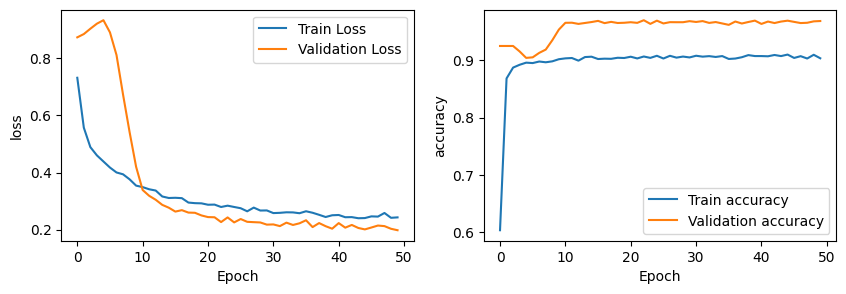

In [ ]:
plot_history(history)

In [ ]:
predictions_val = model_DICE.predict(X_val)

1/1 [==============================] - 0s 430ms/step


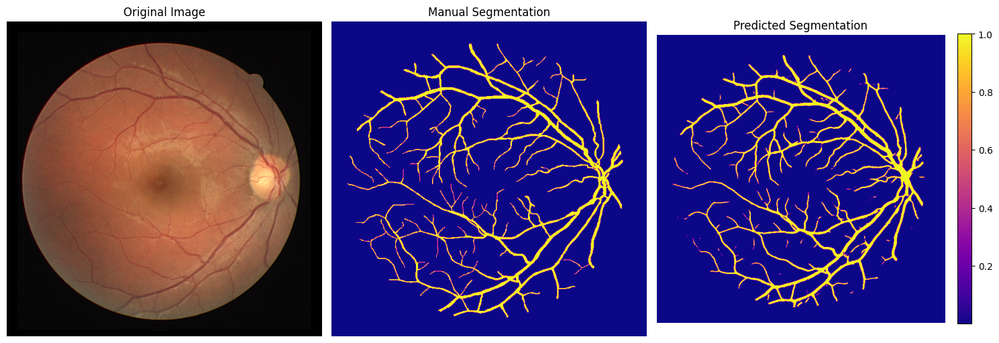

In [ ]:
plot_images_with_masks(X_val[0], y_val[0], predictions_val[0])

Good predictions, let's see how the segmentation predictions establish themselves during the first 10 epochs

Epoch 1/10
 6/50 [==>...........................] - ETA: 42s - loss: 0.8064 - accuracy: 0.4370

1/1 [==============================] - 0s 408ms/step


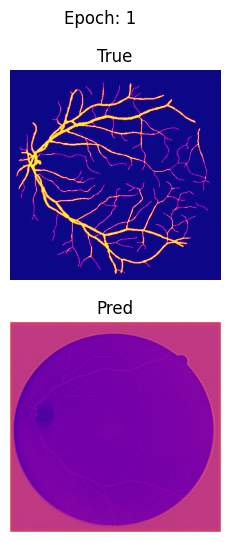

50/50 [==============================] - 57s 946ms/step - loss: 0.6812 - accuracy: 0.6913 - val_loss: 0.8532 - val_accuracy: 0.8717
Epoch 2/10
1/1 [==============================] - 0s 28ms/step


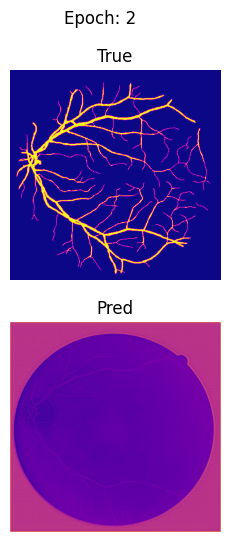

50/50 [==============================] - 46s 907ms/step - loss: 0.4813 - accuracy: 0.9359 - val_loss: 0.8730 - val_accuracy: 0.8726
Epoch 3/10
1/1 [==============================] - 0s 28ms/step


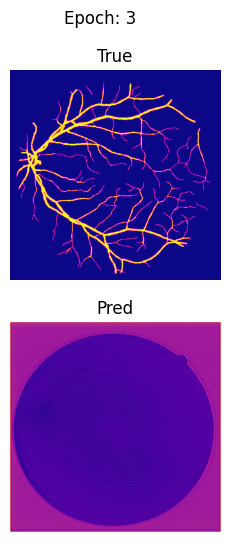

50/50 [==============================] - 46s 922ms/step - loss: 0.4120 - accuracy: 0.9540 - val_loss: 0.8954 - val_accuracy: 0.8726
Epoch 4/10
1/1 [==============================] - 0s 28ms/step


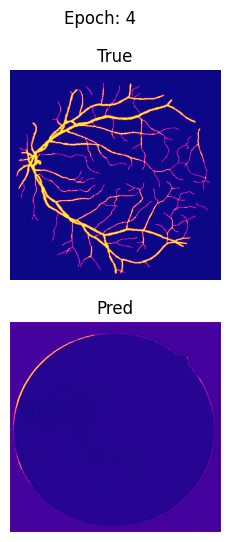

50/50 [==============================] - 46s 922ms/step - loss: 0.3606 - accuracy: 0.9639 - val_loss: 0.9168 - val_accuracy: 0.8708
Epoch 5/10
1/1 [==============================] - 0s 28ms/step


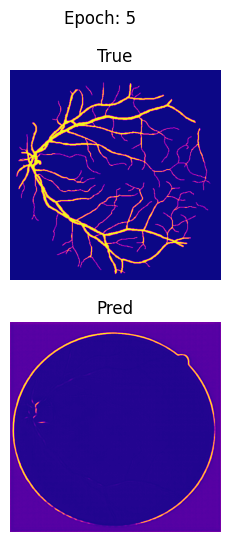

50/50 [==============================] - 46s 911ms/step - loss: 0.3196 - accuracy: 0.9705 - val_loss: 0.9356 - val_accuracy: 0.8599
Epoch 6/10
1/1 [==============================] - 0s 28ms/step


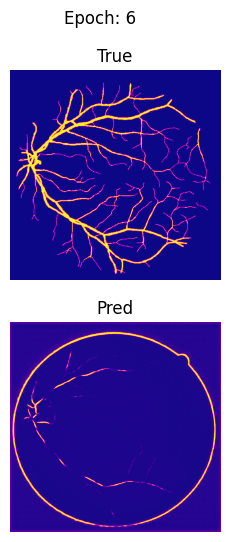

50/50 [==============================] - 46s 921ms/step - loss: 0.2834 - accuracy: 0.9759 - val_loss: 0.8716 - val_accuracy: 0.8574
Epoch 7/10
1/1 [==============================] - 0s 28ms/step


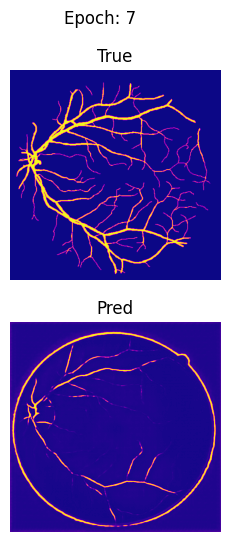

50/50 [==============================] - 46s 922ms/step - loss: 0.2521 - accuracy: 0.9795 - val_loss: 0.7524 - val_accuracy: 0.8662
Epoch 8/10
1/1 [==============================] - 0s 28ms/step


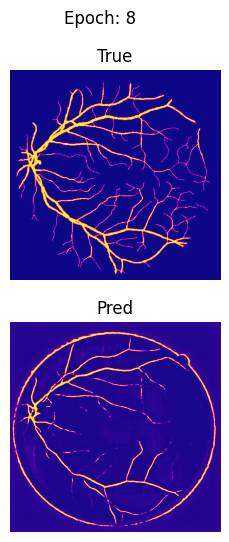

50/50 [==============================] - 46s 911ms/step - loss: 0.2259 - accuracy: 0.9820 - val_loss: 0.6107 - val_accuracy: 0.8793
Epoch 9/10
1/1 [==============================] - 0s 28ms/step


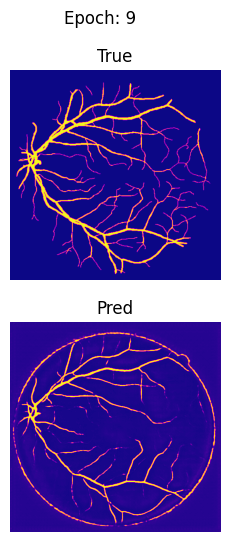

50/50 [==============================] - 46s 922ms/step - loss: 0.2034 - accuracy: 0.9843 - val_loss: 0.5219 - val_accuracy: 0.8910
Epoch 10/10
1/1 [==============================] - 0s 30ms/step


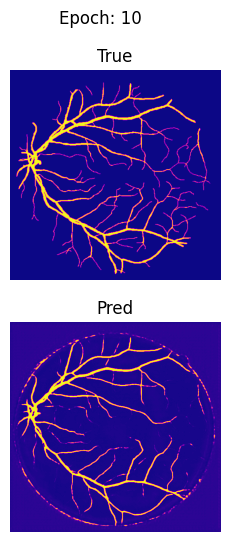

50/50 [==============================] - 46s 921ms/step - loss: 0.1826 - accuracy: 0.9862 - val_loss: 0.4153 - val_accuracy: 0.9050


In [ ]:
#For in the slides
model_DICE = build_unet_bn(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model_DICE.compile(optimizer = Adam(learning_rate=1e-4), loss = dice_loss, metrics=['accuracy'])
history = model_DICE.fit(train_generator, epochs = 10, steps_per_epoch = 50, callbacks = [PredictionPlotter((X_val, y_val), interval=1)], validation_data=(X_val, y_val))

It's interesting to see that the model first focusses on the circle edge of the retina, probably because this is very easy to pick up for the model. By the tenth epoch the cirkle starts to fade away and more detailed vessels are segmented.

### add dropout

In [ ]:
# Building Unet by dividing encoder and decoder into blocks

from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda
from keras.optimizers import Adam
from keras.layers import Activation, MaxPool2D, Concatenate


def conv_block(input, num_filters, p):
    x = Conv2D(num_filters, 3, padding="same")(input)
    #x = BatchNormalization()(x)   #Not in the original network.
    x = Activation("relu")(x)
    x = Dropout(p)(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    #x = BatchNormalization()(x)  #Not in the original network
    x = Activation("relu")(x)
    x = Dropout(p)(x)
    return x

def conv_block_bn(input, num_filters,p=0.0):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)   #Not in the original network.
    x = Activation("relu")(x)
    x = Dropout(p)(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)  #Not in the original network
    x = Activation("relu")(x)
    x = Dropout(p)(x)

    return x

#Encoder block: Conv block followed by maxpooling


def encoder_block(input, num_filters):
    x = conv_block(input, num_filters) # for skip connections
    p = MaxPool2D((2, 2))(x) # input to next layer
    return x, p

def encoder_block_bn(input, num_filters, dropout):
    x = conv_block_bn(input, num_filters, dropout) # for skip connections
    p = MaxPool2D((2, 2))(x) # input to next layer
    return x, p


#Decoder block
#skip features gets input from encoder for concatenation

def decoder_block(input, skip_features, num_filters, p):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    Dropout(p)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters, p)
    return x

def decoder_block_bn(input, skip_features, num_filters, p=0.0):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Dropout(p)(x)
    x = Concatenate()([x, skip_features])
    x = conv_block_bn(x, num_filters, p)
    return x


#Build Unet using the blocks
def build_unet(input_shape, p):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64, p)
    s2, p2 = encoder_block(p1, 128, p)
    s3, p3 = encoder_block(p2, 256, p)
    s4, p4 = encoder_block(p3, 512, p)

    b1 = conv_block(p4, 1024, p) #Bridge

    d1 = decoder_block(b1, s4, 512, p)
    d2 = decoder_block(d1, s3, 256, p)
    d3 = decoder_block(d2, s2, 128, p)
    d4 = decoder_block(d3, s1, 64, p)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)  #Binary (can be multiclass)

    model = Model(inputs, outputs, name="U-Net")
    return model

def build_unet_bn(input_shape, dropout):
    inputs = Input(input_shape)

    s1, p1 = encoder_block_bn(inputs, 64, dropout)
    s2, p2 = encoder_block_bn(p1, 128, dropout)
    s3, p3 = encoder_block_bn(p2, 256, dropout)
    s4, p4 = encoder_block_bn(p3, 512, dropout)

    b1 = conv_block(p4, 1024, dropout) #Bridgec

    d1 = decoder_block_bn(b1, s4, 512, dropout)
    d2 = decoder_block_bn(d1, s3, 256, dropout)
    d3 = decoder_block_bn(d2, s2, 128, dropout)
    d4 = decoder_block_bn(d3, s1, 64, dropout)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)  #Binary (can be multiclass)

    model = Model(inputs, outputs, name="U-Net")
    return model

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    1e-2,
    decay_steps=50*10,
    decay_rate=0.1,
    staircase=True
)
model_DICE = build_unet_bn(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout = 0.05)
model_DICE.compile(optimizer = Adam(learning_rate=lr_schedule), loss = dice_loss, metrics=['accuracy'])
model_DICE.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 544, 544, 3)]        0         []                            
                                                                                                  
 conv2d_84 (Conv2D)          (None, 544, 544, 64)         1792      ['input_6[0][0]']             
                                                                                                  
 batch_normalization_72 (Ba  (None, 544, 544, 64)         256       ['conv2d_84[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_80 (Activation)  (None, 544, 544, 64)         0         ['batch_normalization_72[0

In [ ]:
history = model_DICE.fit(train_generator, epochs = 50, steps_per_epoch = 50, validation_data = (X_val, y_val))

Epoch 1/50
50/50 [==============================] - 48s 751ms/step - loss: 0.6896 - accuracy: 0.7176 - val_loss: 1.0000 - val_accuracy: 0.8726
Epoch 2/50
50/50 [==============================] - 37s 733ms/step - loss: 0.4286 - accuracy: 0.9227 - val_loss: 0.8343 - val_accuracy: 0.0504
Epoch 3/50
50/50 [==============================] - 37s 732ms/step - loss: 0.3130 - accuracy: 0.9489 - val_loss: 0.7788 - val_accuracy: 0.8518
Epoch 4/50
50/50 [==============================] - 37s 734ms/step - loss: 0.2719 - accuracy: 0.9546 - val_loss: 0.6844 - val_accuracy: 0.6717
Epoch 5/50
50/50 [==============================] - 37s 733ms/step - loss: 0.2717 - accuracy: 0.9545 - val_loss: 0.8513 - val_accuracy: 0.8733
Epoch 6/50
50/50 [==============================] - 37s 733ms/step - loss: 0.2577 - accuracy: 0.9568 - val_loss: 0.8329 - val_accuracy: 0.8778
Epoch 7/50
50/50 [==============================] - 37s 734ms/step - loss: 0.2438 - accuracy: 0.9590 - val_loss: 0.8026 - val_accuracy: 0.8793

KeyboardInterrupt: 

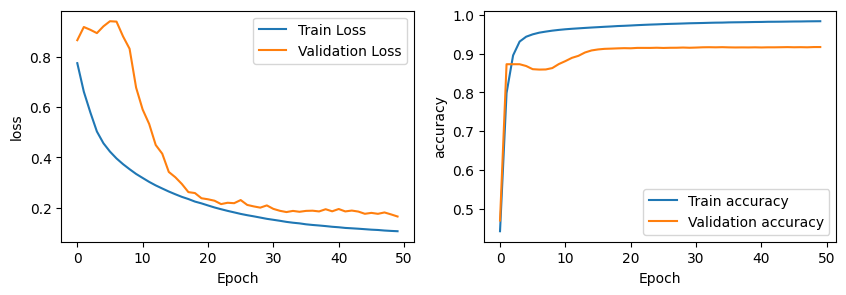

In [ ]:
plot_history(history)

In [ ]:
predictions_train = model_DICE.predict(X_train)
predictions_val = model_DICE.predict(X_val)

1/1 [==============================] - 0s 30ms/step


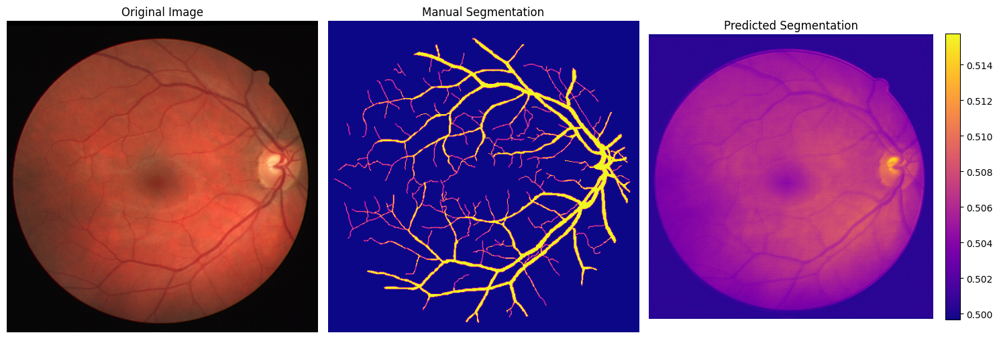

In [ ]:
plot_images_with_masks(X_train[0], y_train[0], predictions_train[0])

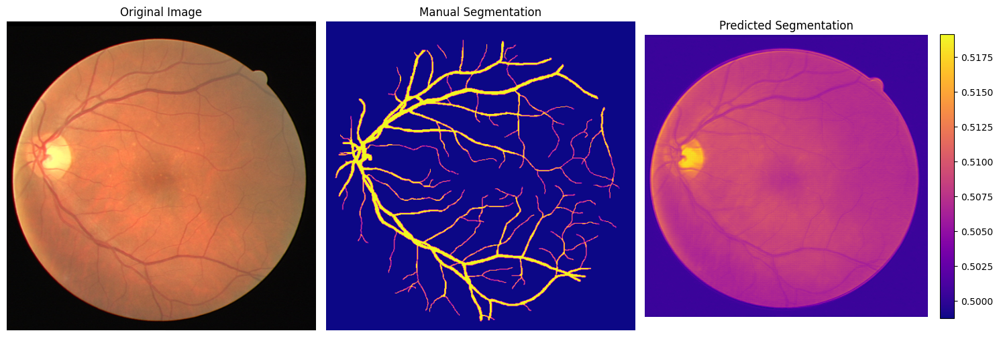

In [ ]:
plot_images_with_masks(X_val[0], y_val[0], predictions_val[0])

### Learning rate schedule

In [4]:
lr_schedule = ExponentialDecay(
    1e-3,
    decay_steps=1000,
    decay_rate=0.1,
    staircase=True)

### SA-UNet

In [ ]:
X = DataLoader.load_images_from_dir_no_preprocessing(X_dir)
y = DataLoader.load_images_from_dir_no_preprocessing(y_dir+'/1st_manual')
masks = DataLoader.load_images_from_dir_no_preprocessing(mask_dir)
masks = np.expand_dims(masks, axis=-1)
#X_test = DataLoader.load_images_from_dir(test_dir)

train_data = []
train_label = []
validate_data = []
validate_label = []

desired_size = 608
for i, j in zip(X, y):
    old_size = i.shape[:2]  # old_size is in (height, width) format
    delta_w = desired_size - old_size[1]
    delta_h = desired_size - old_size[0]

    top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    left, right = delta_w // 2, delta_w - (delta_w // 2)

    color = [0, 0, 0]
    color2 = [0]
    new_im = cv2.copyMakeBorder(i, top, bottom, left, right, cv2.BORDER_CONSTANT,
                                value=color)

    new_label = cv2.copyMakeBorder(j, top, bottom, left, right, cv2.BORDER_CONSTANT,
                                   value=color2)

    train_data.append(cv2.resize(new_im, (desired_size, desired_size)))

    temp = cv2.resize(new_label, (desired_size, desired_size))
    _, temp = cv2.threshold(temp, 0.5, 1, cv2.THRESH_BINARY)
    train_label.append(temp)

X_train, X_val, y_train, y_val = train_test_split(np.array(train_data), np.array(train_label), test_size=0.2, random_state = 42)

IMG_HEIGHT = X_train.shape[1]
IMG_WIDTH = X_train.shape[2]
IMG_CHANNELS = X_train.shape[3]

In [ ]:
#make stronger

In [ ]:
SA_model = SA_UNet(input_size = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), block_size = 7, dropout = 0, start_neurons=16)
SA_model.compile(optimizer = Adam(learning_rate=1e-3), loss = dice_loss, metrics=['accuracy'])
SA_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 544, 544, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 544, 544, 16)   │            448 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 544, 544, 16)   │             64 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 544, 544, 16)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 544, 544, 16)   │              0 │ activation[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 544, 544, 16)   │          2,320 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 544, 544, 16)   │             64 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 544, 544, 16)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 272, 272, 16)   │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 272, 272, 32)   │          4,640 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 272, 272, 32)   │            128 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 272, 272, 32)   │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 272, 272, 32)   │              0 │ activation_2[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 272, 272, 32)   │          9,248 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 272, 272, 32)   │            128 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 272, 272, 32)   │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1      

 Total params: 538,707 (2.06 MB)

 Trainable params: 537,299 (2.05 MB)

 Non-trainable params: 1,408 (5.50 KB)

In [ ]:
from keras.callbacks import ModelCheckpoint

In [ ]:
#little trick for compatibility
train_generator = (pair for pair in zip(image_generator, mask_generator))

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = 'SA_UNET.keras',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)
history = SA_model.fit(train_generator, steps_per_epoch = 50, epochs = 50, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 707ms/step - accuracy: 0.5696 - loss: 0.8251
Epoch 1: val_loss improved from inf to 0.84617, saving model to SA_UNET.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 82s 753ms/step - accuracy: 0.5720 - loss: 0.8243 - val_accuracy: 0.8726 - val_loss: 0.8462
Epoch 2/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 565ms/step - accuracy: 0.8523 - loss: 0.6906
Epoch 2: val_loss did not improve from 0.84617
50/50 ━━━━━━━━━━━━━━━━━━━━ 28s 568ms/step - accuracy: 0.8524 - loss: 0.6905 - val_accuracy: 0.8726 - val_loss: 0.8823
Epoch 3/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 575ms/step - accuracy: 0.8715 - loss: 0.6262
Epoch 3: val_loss did not improve from 0.84617
50/50 ━━━━━━━━━━━━━━━━━━━━ 29s 577ms/step - accuracy: 0.8716 - loss: 0.6251 - val_accuracy: 0.8560 - val_loss: 0.9018
Epoch 4/50
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.8865 - loss: 0.5062
Epoch 4: val_loss did not improve from 0.84617
50/50 ━━━━━━━━━━━━━━━━━━━━ 28s 568ms/step - accuracy: 0.8865 - loss: 0.5057 - val_a

In [ ]:
preds = SA_model.predict(X_val)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


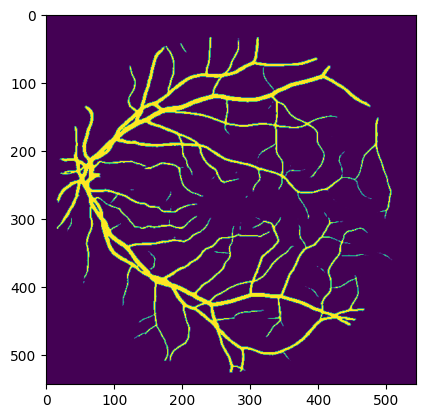

In [ ]:
plt.imshow(preds[0])

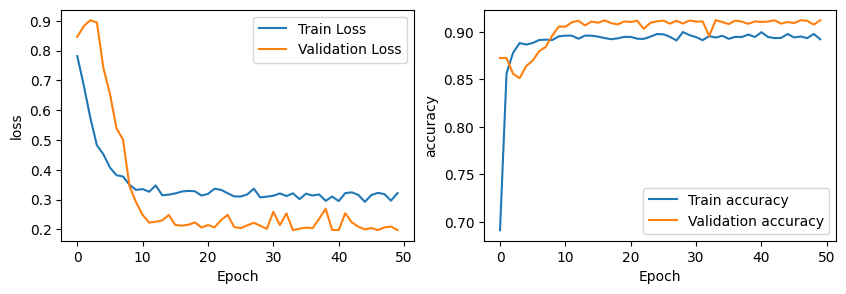

In [ ]:
plot_history(history)

### CBAM-UNet with CFFA

In [ ]:
from SA_UNet import SA_UNet_CFFA_CBAM

In [ ]:
SA_model = SA_UNet_CFFA_CBAM(input_size = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout = 0, start_neurons=16)
SA_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
SA_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d_161 (Conv2D)         (None, 608, 608, 16)         448       ['input_9[0][0]']             
                                                                                                  
 dropout_20 (Dropout)        (None, 608, 608, 16)         0         ['conv2d_161[0][0]']          
                                                                                                  
 batch_normalization_140 (B  (None, 608, 608, 16)         64        ['dropout_20[0][0]']          
 atchNormalization)                                                                         

In [ ]:
from keras.callbacks import ModelCheckpoint

In [ ]:
#little trick for compatibility
train_generator = (pair for pair in zip(image_generator, mask_generator))

NameError: name 'image_generator' is not defined

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = 'SA_UNET.keras',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)
history = SA_model.fit(train_generator, steps_per_epoch = 50, epochs = 50, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

NameError: name 'SA_model' is not defined

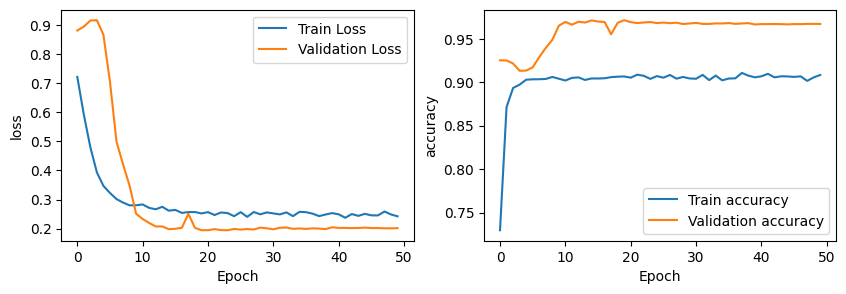

In [ ]:
plot_history(history)

Let's make the architecture more powerful by making the U-Net deeper.

In [ ]:
lr_schedule = ExponentialDecay(
    1e-3,
    decay_steps=1000,
    decay_rate=0.3,
    staircase=True)

In [ ]:
SA_model = SA_UNet_CFFA_CBAM_deep(input_size = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout = 0, start_neurons=32)
SA_model.compile(optimizer = Adam(learning_rate=lr_schedule), loss = dice_loss, metrics=['accuracy'])
SA_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d_37 (Conv2D)          (None, 608, 608, 32)         896       ['input_2[0][0]']             
                                                                                                  
 dropout_12 (Dropout)        (None, 608, 608, 32)         0         ['conv2d_37[0][0]']           
                                                                                                  
 batch_normalization_36 (Ba  (None, 608, 608, 32)         128       ['dropout_12[0][0]']          
 tchNormalization)                                                                            

Fit the model on all training data and make test predictions

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = './SA_UNET_CBAM_final.keras',
            monitor='loss',
            verbose=1,
            save_best_only=True
)
history = SA_model.fit(train_generator, steps_per_epoch = 50, epochs = 100, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/100
50/50 [==============================] - ETA: 0s - loss: 0.6917 - accuracy: 0.7182
Epoch 1: loss improved from inf to 0.69175, saving model to /content/Colab Notebooks/Assignments/DRIVE_U-NET/SA_UNET_CBAM_final.keras
50/50 [==============================] - 77s 681ms/step - loss: 0.6917 - accuracy: 0.7182 - val_loss: 0.8514 - val_accuracy: 0.1587
Epoch 2/100
50/50 [==============================] - ETA: 0s - loss: 0.5208 - accuracy: 0.8812
Epoch 2: loss improved from 0.69175 to 0.52085, saving model to /content/Colab Notebooks/Assignments/DRIVE_U-NET/SA_UNET_CBAM_final.keras
50/50 [==============================] - 28s 565ms/step - loss: 0.5208 - accuracy: 0.8812 - val_loss: 0.9037 - val_accuracy: 0.9224
Epoch 3/100
50/50 [==============================] - ETA: 0s - loss: 0.4055 - accuracy: 0.8973
Epoch 3: loss improved from 0.52085 to 0.40547, saving model to /content/Colab Notebooks/Assignments/DRIVE_U-NET/SA_UNET_CBAM_final.keras
50/50 [==============================] - 

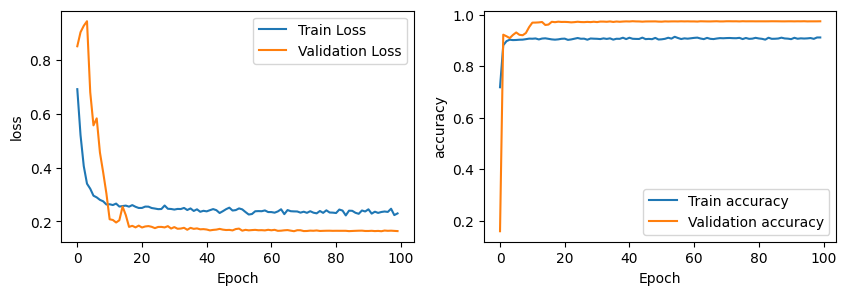

In [ ]:
plot_history(history)

In [ ]:
SA_model_loaded = tf.keras.saving.load_model("./DRIVE_U-NET/SA_UNET_CBAM_final.keras", safe_mode = False)

TypeError: Could not locate function 'dice_loss'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'module': 'builtins', 'class_name': 'function', 'config': 'dice_loss', 'registered_name': 'function'}

In [ ]:
final_preds = SA_model.predict(X_test)
np.save('./DRIVE_U-NET/final_preds.npy', final_preds)

1/1 [==============================] - 16s 16s/step


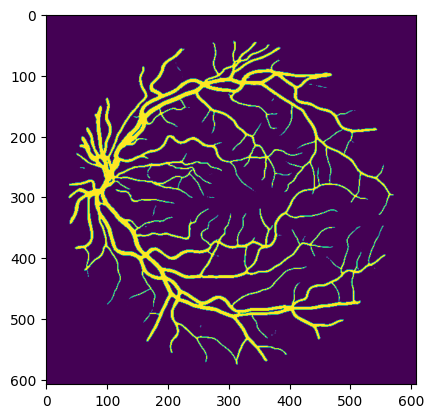

In [ ]:
plt.imshow(final_preds[0])

In [ ]:
#make test preds

### CMP-UNet

In [ ]:
CMP_model = build_CMP_UNet(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
CMP_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
CMP_model.summary()

(None, 608, 608, 4)
(None, 608, 608, 32)
(None, 608, 608, 32)
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d_420 (Conv2D)         (None, 608, 608, 32)         896       ['input_9[0][0]']             
                                                                                                  
 batch_normalization_414 (B  (None, 608, 608, 32)         128       ['conv2d_420[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_430 (Activation  (

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = 'CMP_UNet.keras',
            monitor='val_loss',
            verbose=1,
            save_best_only=True
)
history = CMP_model.fit(train_generator, steps_per_epoch = 50, epochs = 50, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/50
50/50 [==============================] - ETA: 0s - loss: 0.6134 - accuracy: 0.7822
Epoch 1: val_loss improved from inf to 0.89965, saving model to CMP_UNet.keras
50/50 [==============================] - 144s 1s/step - loss: 0.6134 - accuracy: 0.7822 - val_loss: 0.8996 - val_accuracy: 0.9252
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 0.3665 - accuracy: 0.8925
Epoch 2: val_loss improved from 0.89965 to 0.89097, saving model to CMP_UNet.keras
50/50 [==============================] - 50s 991ms/step - loss: 0.3665 - accuracy: 0.8925 - val_loss: 0.8910 - val_accuracy: 0.2560
Epoch 3/50
50/50 [==============================] - ETA: 0s - loss: 0.3117 - accuracy: 0.9000
Epoch 3: val_loss did not improve from 0.89097
50/50 [==============================] - 47s 946ms/step - loss: 0.3117 - accuracy: 0.9000 - val_loss: 0.9887 - val_accuracy: 0.8069
Epoch 4/50
50/50 [==============================] - ETA: 0s - loss: 0.3012 - accuracy: 0.9006
Epoch 4: val_loss did

KeyboardInterrupt: 

Interrupted, will train on all training data now

In [ ]:
CMP_model = build_CMP_UNet(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
CMP_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
CMP_model.summary()

(None, 608, 608, 4)
(None, 608, 608, 32)
(None, 608, 608, 32)
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d_491 (Conv2D)         (None, 608, 608, 32)         896       ['input_10[0][0]']            
                                                                                                  
 batch_normalization_484 (B  (None, 608, 608, 32)         128       ['conv2d_491[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_506 (Activation  (

In [ ]:
model_checkpoint = ModelCheckpoint(
            filepath = 'CMP_UNet_final.keras',
            monitor='loss',
            verbose=1,
            save_best_only=True
)
history = CMP_model.fit(all_train_generator, steps_per_epoch = 50, epochs = 50, callbacks = [model_checkpoint], validation_data=(X_val, y_val))

Epoch 1/50
50/50 [==============================] - ETA: 0s - loss: 0.6748 - accuracy: 0.6761
Epoch 1: loss improved from inf to 0.67483, saving model to CMP_UNet_final.keras
50/50 [==============================] - 101s 1s/step - loss: 0.6748 - accuracy: 0.6761 - val_loss: 0.8875 - val_accuracy: 0.9252
Epoch 2/50
50/50 [==============================] - ETA: 0s - loss: 0.3968 - accuracy: 0.8899
Epoch 2: loss improved from 0.67483 to 0.39682, saving model to CMP_UNet_final.keras
50/50 [==============================] - 50s 996ms/step - loss: 0.3968 - accuracy: 0.8899 - val_loss: 0.9516 - val_accuracy: 0.9252
Epoch 3/50
50/50 [==============================] - ETA: 0s - loss: 0.3161 - accuracy: 0.9006
Epoch 3: loss improved from 0.39682 to 0.31606, saving model to CMP_UNet_final.keras
50/50 [==============================] - 50s 1s/step - loss: 0.3161 - accuracy: 0.9006 - val_loss: 0.9753 - val_accuracy: 0.9219
Epoch 4/50
50/50 [==============================] - ETA: 0s - loss: 0.2939 -

In [ ]:
final_preds = CMP_model.predict(X_test)
np.save('./final_preds.npy', final_preds)

1/1 [==============================] - 78s 78s/step


In [ ]:
CMP_model.save('CMP_final.keras')

### CMP-UNet with dropout

In [ ]:
CMP_model = build_CMP_UNet(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout=0.15)
CMP_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
CMP_model.summary()

(None, 608, 608, 4)
(None, 608, 608, 32)
(None, 608, 608, 32)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 608, 608, 32)         896       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 608, 608, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (No

In [ ]:
history = CMP_model.fit(train_generator, steps_per_epoch = 50, epochs = 25, callbacks = [EarlyStopping("val_loss", min_delta = 0.01, patience = 8)], validation_data=(X_val, y_val))

Epoch 1/25
50/50 [==============================] - 188s 1s/step - loss: 0.6991 - accuracy: 0.7184 - val_loss: 0.8957 - val_accuracy: 0.9252
Epoch 2/25
50/50 [==============================] - 54s 1s/step - loss: 0.3980 - accuracy: 0.8886 - val_loss: 0.9608 - val_accuracy: 0.9252
Epoch 3/25
50/50 [==============================] - 54s 1s/step - loss: 0.3206 - accuracy: 0.8992 - val_loss: 0.9860 - val_accuracy: 0.9237
Epoch 4/25
50/50 [==============================] - 54s 1s/step - loss: 0.3014 - accuracy: 0.9007 - val_loss: 0.9939 - val_accuracy: 0.9211
Epoch 5/25
50/50 [==============================] - 54s 1s/step - loss: 0.2938 - accuracy: 0.9021 - val_loss: 0.9406 - val_accuracy: 0.9151
Epoch 6/25
50/50 [==============================] - 54s 1s/step - loss: 0.2868 - accuracy: 0.9000 - val_loss: 0.8694 - val_accuracy: 0.9158
Epoch 7/25
50/50 [==============================] - 54s 1s/step - loss: 0.2814 - accuracy: 0.9016 - val_loss: 0.8353 - val_accuracy: 0.9149
Epoch 8/25
50/50 [=

We decide to not go further with dropout

###CMP-UNet with CBAM

In [ ]:
CMP_model = build_CMP_UNet_CBAM(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dropout=0)
CMP_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
CMP_model.summary()

(None, 608, 608, 4)
(None, 608, 608, 32)
(None, 608, 608, 32)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 608, 608, 32)         896       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 608, 608, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (No

In [ ]:
history = CMP_model.fit(train_generator, steps_per_epoch = 50, epochs = 25, callbacks = [EarlyStopping("val_loss", min_delta = 0.01, patience = 8)], validation_data=(X_val, y_val))

Epoch 1/25
50/50 [==============================] - 145s 1s/step - loss: 0.6145 - accuracy: 0.7596 - val_loss: 0.8600 - val_accuracy: 0.0780
Epoch 2/25
50/50 [==============================] - 48s 965ms/step - loss: 0.3758 - accuracy: 0.8907 - val_loss: 0.8605 - val_accuracy: 0.0765
Epoch 3/25
50/50 [==============================] - 48s 965ms/step - loss: 0.3168 - accuracy: 0.8995 - val_loss: 0.8516 - val_accuracy: 0.1468
Epoch 4/25
50/50 [==============================] - 48s 966ms/step - loss: 0.3016 - accuracy: 0.9007 - val_loss: 0.9969 - val_accuracy: 0.8882
Epoch 5/25
50/50 [==============================] - 48s 966ms/step - loss: 0.2967 - accuracy: 0.9017 - val_loss: 0.9439 - val_accuracy: 0.8846
Epoch 6/25
50/50 [==============================] - 48s 966ms/step - loss: 0.2892 - accuracy: 0.8997 - val_loss: 0.7895 - val_accuracy: 0.9137
Epoch 7/25
50/50 [==============================] - 48s 966ms/step - loss: 0.2813 - accuracy: 0.9016 - val_loss: 0.6749 - val_accuracy: 0.9161
E

### CMP-UNet visualization

In [ ]:
CMP_model = build_CMP_UNet(input_shape = (IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
CMP_model.compile(optimizer = Adam(lr_schedule), loss = dice_loss, metrics=['accuracy'])
CMP_model.summary()

(None, 608, 608, 4)
(None, 608, 608, 32)
(None, 608, 608, 32)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 608, 608, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 608, 608, 32)         896       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 608, 608, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (No

Epoch 1/10
50/50 [==============================] - 143s 1s/step - loss: 0.5923 - accuracy: 0.7870 - val_loss: 0.8863 - val_accuracy: 0.9250
Epoch 2/10
1/1 [==============================] - 3s 3s/step


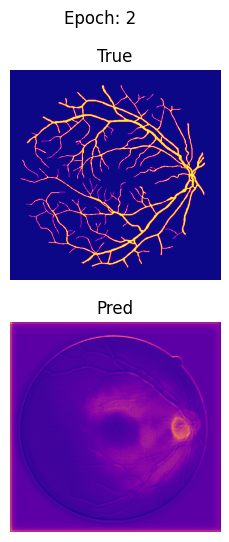

50/50 [==============================] - 51s 1s/step - loss: 0.3705 - accuracy: 0.8924 - val_loss: 0.9630 - val_accuracy: 0.9252
Epoch 3/10
50/50 [==============================] - 48s 964ms/step - loss: 0.3093 - accuracy: 0.9006 - val_loss: 0.9845 - val_accuracy: 0.9226
Epoch 4/10
1/1 [==============================] - 0s 283ms/step


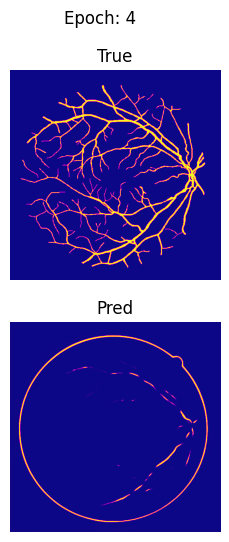

50/50 [==============================] - 49s 973ms/step - loss: 0.2956 - accuracy: 0.9013 - val_loss: 0.9677 - val_accuracy: 0.9096
Epoch 5/10
50/50 [==============================] - 48s 964ms/step - loss: 0.2883 - accuracy: 0.9027 - val_loss: 0.9270 - val_accuracy: 0.8941
Epoch 6/10
1/1 [==============================] - 0s 284ms/step


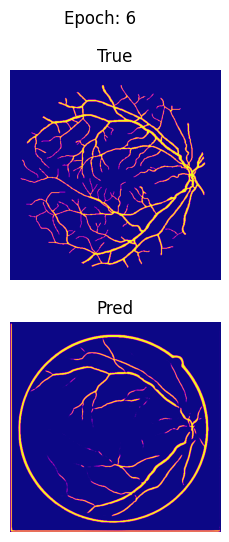

50/50 [==============================] - 49s 976ms/step - loss: 0.2812 - accuracy: 0.9007 - val_loss: 0.7518 - val_accuracy: 0.8990
Epoch 7/10
50/50 [==============================] - 48s 965ms/step - loss: 0.2755 - accuracy: 0.9022 - val_loss: 0.6153 - val_accuracy: 0.9096
Epoch 8/10
1/1 [==============================] - 0s 295ms/step


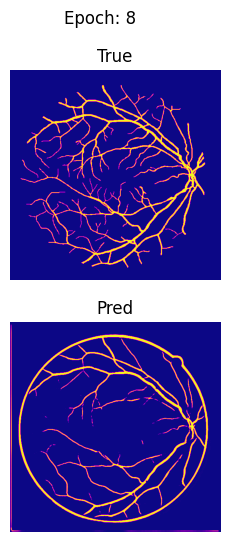

50/50 [==============================] - 49s 984ms/step - loss: 0.2787 - accuracy: 0.9006 - val_loss: 0.5162 - val_accuracy: 0.9256
Epoch 9/10
50/50 [==============================] - 48s 965ms/step - loss: 0.2686 - accuracy: 0.9018 - val_loss: 0.4249 - val_accuracy: 0.9391
Epoch 10/10
1/1 [==============================] - 0s 286ms/step


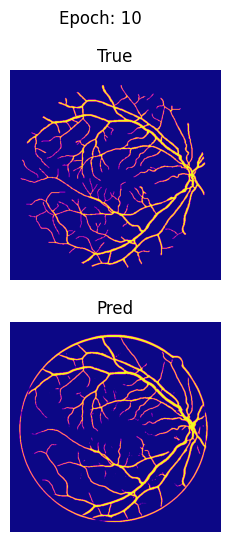

50/50 [==============================] - 49s 974ms/step - loss: 0.2572 - accuracy: 0.9049 - val_loss: 0.2883 - val_accuracy: 0.9548


In [ ]:
history = CMP_model.fit(train_generator, steps_per_epoch = 50, epochs = 10, callbacks = [PredictionPlotter((X_val, y_val), interval=2)], validation_data=(X_val, y_val))

In [ ]:
visualization_model = tf.keras.saving.load_model('CMP_UNet_final.keras', custom_objects={"dice_loss": dice_loss})

In [ ]:
valid_preds = visualization_model.predict(X_val)

1/1 [==============================] - 3s 3s/step


In [ ]:
np.save('val_preds.npy', valid_preds)

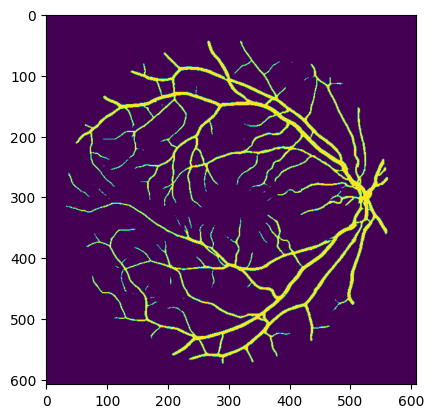

In [ ]:
plt.imshow(valid_preds[0])

### SA_UNet visualization

In [ ]:
visualization_model = tf.keras.saving.load_model('./SA_UNET_CBAM_final.keras', custom_objects={"dice_loss": dice_loss}, safe_mode = False)

In [ ]:
valid_preds = visualization_model.predict(X_val)

1/1 [==============================] - 5s 5s/step


In [ ]:
np.save('val_preds_SA.npy', valid_preds)